# Análisis de Expresión Génica de Datos de Cáncer

## Introducción y Objetivos
Este notebook forma parte de un proyecto integral cuyo objetivo principal es la **identificación de biomarcadores y la clasificación de diferentes tipos de cáncer a través del análisis de datos de expresión génica**. Utilizaremos técnicas avanzadas de Machine Learning y visualización para extraer patrones significativos que puedan contribuir al diagnóstico y la comprensión de enfermedades oncológicas.

Para una gestión modular y escalable, el proyecto se ha estructurado en dos notebooks principales:

*   `01_exploring_eda.ipynb` (Este Notebook): Dedicado a la **comprensión, preparación y exploración inicial de los datos (EDA)**, incluyendo la carga, limpieza, validación y visualización de la matriz de expresión génica y los metadatos.
*   `02_feature_selection_&_modeling.ipynb`: Enfocado en la **selección de características, construcción, comparación, optimización y evaluación de modelos de Machine Learning** para las tareas de clasificación.

## Descripción de las Columnas del Dataset

A continuación, se detalla la descripción de las principales columnas utilizadas en los DataFrames `X` (matriz de expresión) y `meta` (metadatos):

### `oncoseq_expresion.parquet` (Matriz de Expresión Génica)

| Columna        | Tipo de Dato | Descripción                                                                                   |
| :------------- | :----------- | :-------------------------------------------------------------------------------------------- |
| `[Nombre_Gen]` | `float64`    | Nivel de expresión log2 para cada gen. Cada columna representa un gen distinto (20.531 en total). |
| `index`        | `object`     | Identificador único de la muestra (código de barras TCGA).                                    |

### `oncoseq_metadatos.csv` (Metadatos de Muestras)

| Columna        | Tipo de Dato | Descripción                                                                                               |
| :------------- | :----------- | :-------------------------------------------------------------------------------------------------------- |
| `index`        | `object`     | Identificador único de la muestra (código de barras TCGA). Coincide con el índice de la matriz de expresión. |
| `participante` | `object`     | Identificador único del paciente. Útil para agrupación y validación.                                    |
| `tipo`         | `object`     | Tipo de tejido de la muestra: 'tumor' o 'normal'. Variable objetivo para clasificación binaria.             |
| `cohorte`      | `object`     | Tipo de cáncer al que pertenece la muestra (e.g., 'BRCA', 'KIRC'). Variable objetivo para clasificación multiclase. |

## Índice de Contenidos

### PARTE 01: Preprocesamiento y EDA (Notebook: 01_exploring_eda.ipynb)

*   [FASE 1: Comprensión y Preparación de los Datos](#fase-1-comprension-y-preparacion-de-los-datos)
    *   [1. Carga de Librerías y creación de carpetas para el proyecto](#1-carga-de-librerias-y-creacion-de-carpetas-para-el-proyecto)
        *   [1.1 Carga de la Matriz de Expresión y Metadatos](#11-carga-de-la-matriz-de-expresion-y-metadatos)
        *   [1.2 Dimensiones del dataset](#12-dimensiones-del-dataset)
        *   [1.3 Alineación de los datos](#13-alineacion-de-los-datos)
    *   [2. Comprobación Básica del Dataset](#2-comprobacion-basica-del-dataset)
        *   [2.1 Composición del dataset](#21-composicion-del-dataset)
        *   [2.2 Tratamiento de genes con expresión nula](#22-tratamiento-de-genes-con-expresion-nula)
        *   [2.3 Estadísticas Globales de expresión génica](#23-estadisticas-globales-de-expresion-genica)
    *   [3. Preparación del Dataset](#3-preparacion-del-dataset)
        *   [3.1 Unión de la matriz de expresión y los metadatos](#31-union-de-la-matriz-de-expresion-y-los-metadatos)
    *   [4. Análisis Exploratorio de Datos (EDA)](#4-analisis-exploratorio-de-datos-eda)
        *   [4.1 Distribución de muestras por tipo](#41-distribucion-de-muestras-por-tipo)
        *   [4.2 Distribución de muestras por cohorte](#42-distribucion-de-muestras-por-cohorte)
        *   [4.3 Distribución global de la expresión génica](#43-distribucion-global-de-la-expresion-genica)
        *   [4.4 Distribución de la varianza génica](#44-distribucion-de-la-varianza-genica)
        *   [4.5 PCA Exploratorio](#45-pca-exploratorio)
            *   [4.5.1 PCA Tumor vs Normal](#451-pca-tumor-vs-normal)
            *   [4.5.2 PCA por cohorte](#452-pca-por-cohorte)
        *   [4.6 Top 50 genes más Variables](#46-top-50-genes-mas-variables)
        *   [4.7 PCA solo de muestras Tumorales](#47-pca-solo-de-muestras-tumorales)
    *   [5. Generación del Reporte de Ranking de Genes](#5-generacion-del-reporte-de-ranking-de-genes)
    *   [6. Documentación Detallada: Generación de CSV y Guardado de Archivos](#6-documentacion-detallada-generacion-de-csv-y-guardado-de-archivos)
        *   [6.1 Guardado del Dataset Limpio (`dataset_clean.csv`)](#61-guardado-del-dataset-limpio-dataset_clean.csv)
        *   [6.2 Montaje de Google Drive y Búsqueda de Archivos](#62-montaje-de-google-drive-y-busqueda-de-archivos)
        *   [6.3 Empaquetado y Descarga de Activos (`assets.zip`)](#63-empaquetado-y-descarga-de-activos-assets.zip)


## 1. Carga de Librerías y creación de carpetas para el proyecto

Aquí se configuran las opciones de visualización de Pandas, se establece un tema para los gráficos de Seaborn y se importan las librerías necesarias para el análisis.

In [ ]:
# Manipulación de datos
import pandas as pd
import numpy as np

# Visualización básica
import matplotlib.pyplot as plt
import seaborn as sns
import os
import glob

# Configuración visual
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)

# Estilo gráficos
sns.set_theme(style="whitegrid")

# Ignorar warnings
import warnings
warnings.filterwarnings("ignore")

from sklearn.decomposition import PCA

from google.colab import drive

from matplotlib.patches import Patch


Para organizar mejor las visualizaciones generadas, crearemos una carpeta `assets`. Además, definiremos una función auxiliar para guardar automáticamente los gráficos en formato JPG dentro de esta carpeta, lo que facilitará su posterior uso en informes o presentaciones.

In [ ]:
import matplotlib.pyplot as plt
import os

# Crear la carpeta 'assets' si no existe
assets_folder = 'assets'
os.makedirs(assets_folder, exist_ok=True)
print(f"[INFO] Carpeta de activos '{assets_folder}' asegurada.")

def save_plot(fig, filename, folder=assets_folder, format='jpg'):

    filepath = os.path.join(folder, f"{filename}.{format}")
    fig.savefig(filepath, dpi=300, bbox_inches='tight')
    print(f"[OK] Gráfico '{filename}.{format}' guardado en: '{filepath}'")

[INFO] Carpeta de activos 'assets' asegurada.


### 1.1 Carga de la Matriz de Expresión y Metadatos

En esta sección se cargan los datasets principales: `oncoseq_expresion.parquet` (matriz de expresión génica) y `oncoseq_metadatos.csv` (información clínica de las muestras). Además, se utiliza `gene_names.csv` para renombrar las columnas de la matriz de expresión a símbolos de genes legibles, lo cual es crucial para la interpretabilidad de los resultados.

In [ ]:
def load_csv_to_dataframe(file_path):
    """
    Loads a CSV file into a pandas DataFrame.

    Args:
        file_path (str): The path to the CSV file.

    Returns:
        pd.DataFrame: The loaded DataFrame.
    """
    try:
        df = pd.read_csv(file_path)
        print(f"[OK] '{file_path}' cargado exitosamente.")
        return df
    except FileNotFoundError:
        print(f"[ERROR] El archivo '{file_path}' no fue encontrado.")
        return None
    except Exception as e:
        print(f"[ERROR] Ocurrió un error al cargar '{file_path}': {e}")
        return None

In [ ]:
# Demostración de la función para cargar 'gene_names.csv'

gene_names_path = '/content/data/gene_names.csv'
gene_names_df = load_csv_to_dataframe(gene_names_path)

if gene_names_df is not None:
    print("\nPrimeras 5 filas del DataFrame gene_names:")
    display(gene_names_df.head())

[OK] '/content/data/gene_names.csv' cargado exitosamente.

Primeras 5 filas del DataFrame gene_names:


,gene_id,gene_symbol,chr,gene_length
0,gene_0,100130426,NaN,NaN
1,gene_1,100133144,chr15,2420.0
2,gene_2,100134869,chr15,3190.0
3,gene_3,10357,NaN,NaN
4,gene_4,10431,NaN,NaN


In [ ]:
X    = pd.read_parquet("data/oncoseq_expresion.parquet")  # números
meta = pd.read_csv("data/oncoseq_metadatos.csv")


# --- Renombrar columnas: gene_N -> nombre real ---
gene_names = pd.read_csv("data/gene_names.csv")

# Comprobación: que no haya nombres repetidos (romperían las gráficas)
assert gene_names['gene_symbol'].duplicated().sum() == 0, "Hay símbolos duplicados"
assert len(gene_names) == 20531, "El mapeo no tiene 20531 filas"

mapa = dict(zip(gene_names['gene_id'], gene_names['gene_symbol']))
X = X.rename(columns=mapa)

print("Ejemplo de columnas:", list(X.columns[:5]))

Ejemplo de columnas: ['100130426', '100133144', '100134869', '10357', '10431']


### 1.2 Dimensiones del dataset

En esta sección se exploran las dimensiones de la matriz de expresión génica (`X`) y el DataFrame de metadatos (`meta`) para comprender el tamaño y la estructura de los datos con los que se trabajará. Se muestran el número de filas (muestras) y columnas (genes o características) de cada dataset, junto con las primeras filas para una inspección rápida.

In [ ]:
print("X:")
print(X.shape)
display(X.head())

print("\nMeta:")
print(meta.shape)
display(meta.head())

X:
(1680, 20531)


,100130426,100133144,100134869,10357,10431,136542,155060,26823,280660,317712,340602,388795,390284,391343,391714,404770,441362,442388,553137,57714,645851,652919,653553,728045,728603,728788,729884,8225,90288,A1BG,A1CF,A2BP1,A2LD1,A2ML1,A2M,A4GALT,A4GNT,AAA1,AAAS,AACSL,AACS,AADACL2,AADACL3,AADACL4,AADAC,AADAT,AAGAB,AAK1,AAMP,AANAT,AARS2,AARSD1,AARS,AASDHPPT,AASDH,AASS,AATF,AATK,ABAT,ABCA10,ABCA11P,ABCA12,ABCA13,ABCA17P,ABCA1,ABCA2,ABCA3,ABCA4,ABCA5,ABCA6,ABCA7,ABCA8,ABCA9,ABCB10,ABCB11,ABCB1,ABCB4,ABCB5,ABCB6,ABCB7,ABCB8,ABCB9,ABCC10,ABCC11,ABCC12,ABCC13,ABCC1,ABCC2,ABCC3,ABCC4,ABCC5,ABCC6P1,ABCC6P2,ABCC6,ABCC8,ABCC9,ABCD1,ABCD2,ABCD3,ABCD4,ABCE1,ABCF1,ABCF2,ABCF3,ABCG1,ABCG2,ABCG4,ABCG5,ABCG8,ABHD10,ABHD11,ABHD12B,ABHD12,ABHD13,ABHD14A,ABHD14B,ABHD15,ABHD1,ABHD2,ABHD3,ABHD4,ABHD5,ABHD6,ABHD8,ABI1,ABI2,ABI3BP,ABI3,ABL1,ABL2,ABLIM1,ABLIM2,ABLIM3,ABO,ABP1,ABRA,ABR,ABT1,ABTB1,ABTB2,ACAA1,ACAA2,ACACA,ACACB,ACAD10,ACAD11,ACAD8,ACAD9,ACADL,ACADM,ACADSB,ACADS,ACADVL,ACAN,ACAP1,ACAP2,ACAP3,ACAT1,ACAT2,ACBD3,ACBD4,ACBD5,ACBD6,ACBD7,ACCN1,ACCN2,ACCN3,ACCN4,ACCN5,ACCSL,ACCS,ACD,ACE2,ACER1,ACER2,ACER3,ACE,ACHE,ACIN1,ACLY,ACMSD,ACN9,ACO1,ACO2,ACOT11,ACOT12,ACOT13,ACOT1,ACOT2,ACOT4,ACOT6,ACOT7,ACOT8,ACOT9,ACOX1,ACOX2,ACOX3,ACOXL,ACP1,ACP2,ACP5,ACP6,ACPL2,ACPP,ACPT,ACRBP,ACRC,ACRV1,ACR,ACSBG1,ACSBG2,ACSF2,ACSF3,ACSL1,ACSL3,ACSL4,ACSL5,ACSL6,ACSM1,ACSM2A,ACSM2B,ACSM3,ACSM4,ACSM5,ACSS1,ACSS2,ACSS3,ACTA1,ACTA2,ACTBL2,ACTB,ACTC1,ACTG1,ACTG2,ACTL6A,ACTL6B,ACTL7A,ACTL7B,ACTL8,ACTL9,ACTN1,ACTN2,ACTN3,ACTN4,ACTR10,ACTR1A,ACTR1B,ACTR2,ACTR3B,ACTR3C,ACTR3,ACTR5,ACTR6,ACTR8,ACTRT1,ACTRT2,ACVR1B,ACVR1C,ACVR1,ACVR2A,ACVR2B,ACVRL1,ACY1,ACY3,ACYP1,ACYP2,ADAD1,ADAD2,ADAL,ADAM10,ADAM11,ADAM12,ADAM15,ADAM17,ADAM18,ADAM19,ADAM20,ADAM21P1,ADAM21,ADAM22,ADAM23,ADAM28,ADAM29,ADAM2,ADAM30,ADAM32,ADAM33,ADAM3A,ADAM5P,ADAM6,ADAM7,ADAM8,ADAM9,ADAMDEC1,ADAMTS10,ADAMTS12,ADAMTS13,ADAMTS14,ADAMTS15,ADAMTS16,ADAMTS17,ADAMTS18,ADAMTS19,ADAMTS1,ADAMTS20,ADAMTS2,ADAMTS3,ADAMTS4,ADAMTS5,ADAMTS6,ADAMTS7,ADAMTS8,ADAMTS9,ADAMTSL1,ADAMTSL2,ADAMTSL3,ADAMTSL4,ADAMTSL5,ADAP1,ADAP2,ADARB1,ADARB2,ADAR,ADAT1,ADAT2,ADAT3,ADA,ADCK1,ADCK2,ADCK4,ADCK5,ADCY10,ADCY1,ADCY2,ADCY3,ADCY4,ADCY5,ADCY6,ADCY7,ADCY8,ADCY9,ADCYAP1R1,ADCYAP1,ADC,ADD1,ADD2,ADD3,ADH1A,ADH1B,ADH1C,ADH4,ADH5,ADH6,ADH7,ADHFE1,ADI1,ADIG,ADIPOQ,ADIPOR1,ADIPOR2,ADK,ADM2,ADM,ADNP2,ADNP,ADORA1,ADORA2A,ADORA2B,ADORA3,ADO,ADPGK,ADPRHL1,ADPRHL2,ADPRH,ADRA1A,ADRA1B,ADRA1D,ADRA2A,ADRA2B,ADRA2C,ADRB1,ADRB2,ADRB3,ADRBK1,ADRBK2,ADRM1,ADSL,ADSSL1,ADSS,AEBP1,AEBP2,AEN,AES,AFAP1L1,AFAP1L2,AFAP1,AFARP1,AFF1,AFF2,AFF3,AFF4,AFG3L1,AFG3L2,AFMID,AFM,AFP,AFTPH,AG2,AGAP11,AGAP1,AGAP2,AGAP3,AGAP4,AGAP5,AGAP6,AGAP7,AGAP8,AGA,AGBL1,AGBL2,AGBL3,AGBL4,AGBL5,AGER,AGFG1,AGFG2,AGGF1,AGK,AGL,AGMAT,AGPAT1,AGPAT2,AGPAT3,AGPAT4,AGPAT5,AGPAT6,AGPAT9,AGPHD1,AGPS,AGR2,AGR3,AGRN,AGRP,AGTPBP1,AGTR1,AGTR2,AGTRAP,AGT,AGXT2L1,AGXT2L2,AGXT2,AGXT,AHCTF1,AHCYL1,AHCYL2,AHCY,AHDC1,AHI1,AHNAK2,AHNAK,AHRR,AHR,AHSA1,AHSA2,AHSG,AHSP,AICDA,AIDA,AIF1L,AIF1,AIFM1,AIFM2,AIFM3,AIG1,AIM1L,AIM1,AIM2,AIMP1,AIMP2,AIPL1,AIP,AIRE,AJAP1,AK1,AK2,AK3L1,AK3,AK5,AK7,AKAP10,AKAP11,AKAP12,AKAP13,AKAP14,AKAP1,AKAP2,AKAP3,AKAP4,AKAP5,AKAP6,AKAP7,AKAP8L,AKAP8,AKAP9,AKD1,AKIRIN1,AKIRIN2,AKNAD1,AKNA,AKR1A1,AKR1B10,AKR1B15,AKR1B1,AKR1C1,AKR1C2,AKR1C3,AKR1C4,AKR1CL1,AKR1D1,AKR1E2,AKR7A2,AKR7A3,AKR7L,AKT1S1,AKT1,AKT2,AKT3,AKTIP,ALAD,ALAS1,ALAS2,ALB,ALCAM,ALDH16A1,ALDH18A1,ALDH1A1,ALDH1A2,ALDH1A3,ALDH1B1,ALDH1L1,ALDH1L2,ALDH2,ALDH3A1,ALDH3A2,ALDH3B1,ALDH3B2,ALDH4A1,ALDH5A1,ALDH6A1,ALDH7A1,ALDH8A1,ALDH9A1,ALDOA,ALDOB,ALDOC,ALG10B,ALG10,ALG11,ALG12,ALG13,ALG14,ALG1L2,ALG1L,ALG1,ALG2,ALG3,ALG5,ALG6,ALG8,ALG9,ALKBH1,ALKBH2,ALKBH3,ALKBH4,ALKBH5,ALKBH6,ALKBH7,ALKBH8,ALK,ALLC,ALMS1P,ALMS1,ALOX12B,ALOX12P2,ALOX12,ALOX15B,ALOX15,ALOX5AP,ALOX5,ALOXE3,ALPI,ALPK1,ALPK2,ALPK3,ALPL,ALPPL2,ALPP,ALS2CL,ALS2CR11,ALS2CR12,ALS2CR4,ALS2CR8,ALS2,ALX1,ALX3,ALX4,AMAC1L2,AMAC1L3,AMAC1,AMACR,AMBN,AMBP,AMBRA1,AMD1,AMDHD1,AMDHD2,AMELX,AMELY,AMFR,AMHR2,AMH,AMICA1,AMIGO1,AMIGO2,AMIGO3,AMMECR1L,AMMECR1,AMN1,AMN,AMOTL1,AMOTL2,AMOT,AM


Meta:
(1680, 4)


,index,participante,tipo,cohorte
0,TCGA-A7-A0CE-01A-11R-A00Z-07,TCGA-A7-A0CE,tumor,BRCA
1,TCGA-A7-A0CH-01A-21R-A00Z-07,TCGA-A7-A0CH,tumor,BRCA
2,TCGA-A7-A0D9-01A-31R-A056-07,TCGA-A7-A0D9,tumor,BRCA
3,TCGA-A7-A0DB-01A-11R-A00Z-07,TCGA-A7-A0DB,tumor,BRCA
4,TCGA-A7-A13E-01A-11R-A12P-07,TCGA-A7-A13E,tumor,BRCA


### 1.3 Alineación de los datos

En primer lugar, la columna `index` de los metadatos se establece como índice del DataFrame.

In [ ]:
meta = meta.set_index("index")


In [ ]:
print(meta.columns.tolist())

['participante', 'tipo', 'cohorte']


In [ ]:
print(meta.index[:5])

Index(['TCGA-A7-A0CE-01A-11R-A00Z-07', 'TCGA-A7-A0CH-01A-21R-A00Z-07',
       'TCGA-A7-A0D9-01A-31R-A056-07', 'TCGA-A7-A0DB-01A-11R-A00Z-07',
       'TCGA-A7-A13E-01A-11R-A12P-07'],
      dtype='object', name='index')


Posteriormente, los metadatos se reordenan utilizando los índices de la matriz de expresión para garantizar que ambas tablas compartan exactamente el mismo orden de muestras.

Una vez alineados los datos, se generan las variables auxiliares que se utilizarán en las tareas de clasificación:

- **y**: variable objetivo binaria, donde `1` representa una muestra tumoral y `0` una muestra normal.
- **grupos**: identificador del participante al que pertenece cada muestra, útil para futuras estrategias de validación y análisis.

In [ ]:
# Alinear por el código de barras (defensivo: nunca asumas que el orden coincide)
meta = meta.loc[X.index]

y = (meta["tipo"] == "tumor").astype(int)   # 1 = tumor, 0 = normal
grupos = meta["participante"]               # a quién pertenece cada muestra

Finalmente, se realiza una comprobación mediante una aserción para verificar que los índices de ambas estructuras coinciden perfectamente. Este paso es crítico, ya que cualquier desalineación podría provocar que los perfiles de expresión génica se asociaran a etiquetas incorrectas.

In [ ]:
assert (X.index == meta.index).all()

print("✅ Índices alineados")

✅ Índices alineados


## 2. Comprobación Básica del Dataset

### 2.1 Composición del dataset


Como primer paso, se realiza una validación básica de la matriz de expresión génica y de los metadatos asociados. Esta comprobación permite verificar las dimensiones del conjunto de datos, detectar posibles valores nulos o duplicados y analizar la distribución de las muestras entre las diferentes clases y cohortes.

In [ ]:
print("=== MATRIZ DE EXPRESIÓN ===")
print(f"Muestras: {X.shape[0]}")
print(f"Genes: {X.shape[1]}")
print(f"Rango: [{X.min().min():.3f}, {X.max().max():.3f}]")
print(f"Nulos: {X.isna().sum().sum()}")

# Duplicados
print(f"Muestras duplicadas: {X.index.duplicated().sum()}")

# Genes duplicados
print(f"Genes duplicados: {X.columns.duplicated().sum()}")

print("\n=== METADATOS ===")
print(meta["tipo"].value_counts())

print("\n=== COHORTES ===")
print(meta["cohorte"].value_counts())

print("\n=== METADATOS NULOS ===")
print(meta.isna().sum())


=== MATRIZ DE EXPRESIÓN ===
Muestras: 1680
Genes: 20531
Rango: [0.000, 22.721]
Nulos: 0
Muestras duplicadas: 0
Genes duplicados: 0

=== METADATOS ===
tipo
tumor     1344
normal     336
Name: count, dtype: int64

=== COHORTES ===
cohorte
BRCA    560
KIRC    360
LUAD    295
PRAD    260
COAD    205
Name: count, dtype: int64

=== METADATOS NULOS ===
participante    0
tipo            0
cohorte         0
dtype: int64


La matriz de expresión génica está compuesta por **1.680 muestras** y **20.531 genes**, distribuidas en cinco cohortes asociadas a distintos tipos de cáncer:

- **BRCA** (Breast Invasive Carcinoma)
- **KIRC** (Kidney Renal Clear Cell Carcinoma)
- **LUAD** (Lung Adenocarcinoma)
- **PRAD** (Prostate Adenocarcinoma)
- **COAD** (Colon Adenocarcinoma)

Además de las muestras tumorales, el conjunto de datos incluye muestras de tejido normal utilizadas como referencia biológica. La distribución global es la siguiente:

- **1.344 muestras tumorales**
- **336 muestras normales**

Dado que uno de los objetivos del proyecto es abordar el problema desde una perspectiva jerárquica, se ha decidido conservar inicialmente la totalidad de las muestras en la matriz de expresión. Esta decisión permitirá desarrollar dos niveles de análisis complementarios:

1. **Clasificación binaria:** diferenciación entre muestras tumorales y muestras normales.
2. **Clasificación multiclase:** identificación del tipo de cáncer (BRCA, KIRC, LUAD, PRAD o COAD) utilizando únicamente las muestras tumorales.

Por tanto, durante la fase exploratoria y de validación de la calidad de los datos se trabajará con el conjunto completo de 1.680 muestras. Posteriormente, para la tarea de clasificación por tipo de cáncer, se filtrarán las muestras normales y se emplearán exclusivamente las muestras tumorales correspondientes a cada cohorte.

### 2.2 Tratamiento de genes con expresión nula

Como parte del control de calidad, se calculó el porcentaje de valores de expresión iguales a cero en la matriz génica. Esta métrica permite estimar el grado de esparsidad del dataset e identificar posibles genes con baja actividad biológica.


In [ ]:
# Porcentaje de genes apagados
v = X.values.ravel()

print(f"Porcentaje de ceros: {(v == 0).mean()*100:.2f}%")

Porcentaje de ceros: 14.14%


Durante el control de calidad se observó que el **14,14% de los valores de expresión eran cero**. No obstante, se decidió mantener todos los genes en esta fase, ya que la presencia de valores cero son habituales en datos RNA-seq y no implica que un gen carezca de relevancia biológica.

Con el objetivo de preservar toda la información disponible para el análisis exploratorio, se conservaron los 20.531 genes originales. El posible filtrado de genes con baja expresión o escasa variabilidad se evaluará posteriormente durante la fase de selección de características para Machine Learning.

### 2.3 Estadisticas Globales de expresión génica

La revisión de estas estadísticas permite identificar posibles anomalías, evaluar la dispersión de los datos y comprobar que los niveles de expresión se encuentran dentro de rangos coherentes para datos de RNA-seq transformados. Además, proporciona una primera aproximación a la heterogeneidad biológica presente en las distintas muestras y cohortes analizadas.

In [ ]:
print(X.describe().T[["mean","std","min","max"]].describe())

               mean           std           min           max
count  20531.000000  20531.000000  20531.000000  20531.000000
mean       6.459868      1.113628      3.300262     10.918754
std        3.820052      0.758211      3.380724      3.438819
min        0.000000      0.000000      0.000000      0.000000
25%        3.024002      0.571853      0.000000      9.613632
50%        7.517366      0.889216      2.479981     11.595467
75%        9.574034      1.502187      6.351840     13.021497
max       16.473528      6.421215     14.560132     22.721336


El análisis descriptivo de los **20.531 genes** muestra una `media global` de expresión por gen de 6,46 y una `desviación estándar media` de 1,11. Los valores de expresión oscilan entre 0 y 22,72, un rango coherente con datos RNA-seq transformados mediante log2.

La `mediana de expresión` se sitúa en 7,52, lo que indica que la mayoría de los genes presentan niveles de expresión moderados. Asimismo, la variabilidad observada entre genes sugiere la existencia de **patrones de expresión heterogéneos**, lo que resulta esperable en un conjunto de datos que combina tejido tumoral y tejido normal perteneciente a diferentes cohortes de cáncer.

En conjunto, las estadísticas obtenidas no muestran valores anómalos ni inconsistencias que requieran acciones de limpieza adicionales, por lo que el dataset se considera apto para continuar con la fase de análisis exploratorio.


## 3. Preparación del Dataset

### 3.1 Unión de la matriz de expresión y los metadatos

Para facilitar el análisis exploratorio, se integra la matriz de expresión génica con los metadatos clínicos mediante el identificador único de cada muestra. El resultado es un único DataFrame que contiene tanto los niveles de expresión de los 20.531 genes como la información descriptiva de cada muestra (tipo, cohorte y participante).  

In [ ]:
# Realizamos un merge para unir los dos dataset

df = X.join(meta)

df.head()

,100130426,100133144,100134869,10357,10431,136542,155060,26823,280660,317712,340602,388795,390284,391343,391714,404770,441362,442388,553137,57714,645851,652919,653553,728045,728603,728788,729884,8225,90288,A1BG,A1CF,A2BP1,A2LD1,A2ML1,A2M,A4GALT,A4GNT,AAA1,AAAS,AACSL,AACS,AADACL2,AADACL3,AADACL4,AADAC,AADAT,AAGAB,AAK1,AAMP,AANAT,AARS2,AARSD1,AARS,AASDHPPT,AASDH,AASS,AATF,AATK,ABAT,ABCA10,ABCA11P,ABCA12,ABCA13,ABCA17P,ABCA1,ABCA2,ABCA3,ABCA4,ABCA5,ABCA6,ABCA7,ABCA8,ABCA9,ABCB10,ABCB11,ABCB1,ABCB4,ABCB5,ABCB6,ABCB7,ABCB8,ABCB9,ABCC10,ABCC11,ABCC12,ABCC13,ABCC1,ABCC2,ABCC3,ABCC4,ABCC5,ABCC6P1,ABCC6P2,ABCC6,ABCC8,ABCC9,ABCD1,ABCD2,ABCD3,ABCD4,ABCE1,ABCF1,ABCF2,ABCF3,ABCG1,ABCG2,ABCG4,ABCG5,ABCG8,ABHD10,ABHD11,ABHD12B,ABHD12,ABHD13,ABHD14A,ABHD14B,ABHD15,ABHD1,ABHD2,ABHD3,ABHD4,ABHD5,ABHD6,ABHD8,ABI1,ABI2,ABI3BP,ABI3,ABL1,ABL2,ABLIM1,ABLIM2,ABLIM3,ABO,ABP1,ABRA,ABR,ABT1,ABTB1,ABTB2,ACAA1,ACAA2,ACACA,ACACB,ACAD10,ACAD11,ACAD8,ACAD9,ACADL,ACADM,ACADSB,ACADS,ACADVL,ACAN,ACAP1,ACAP2,ACAP3,ACAT1,ACAT2,ACBD3,ACBD4,ACBD5,ACBD6,ACBD7,ACCN1,ACCN2,ACCN3,ACCN4,ACCN5,ACCSL,ACCS,ACD,ACE2,ACER1,ACER2,ACER3,ACE,ACHE,ACIN1,ACLY,ACMSD,ACN9,ACO1,ACO2,ACOT11,ACOT12,ACOT13,ACOT1,ACOT2,ACOT4,ACOT6,ACOT7,ACOT8,ACOT9,ACOX1,ACOX2,ACOX3,ACOXL,ACP1,ACP2,ACP5,ACP6,ACPL2,ACPP,ACPT,ACRBP,ACRC,ACRV1,ACR,ACSBG1,ACSBG2,ACSF2,ACSF3,ACSL1,ACSL3,ACSL4,ACSL5,ACSL6,ACSM1,ACSM2A,ACSM2B,ACSM3,ACSM4,ACSM5,ACSS1,ACSS2,ACSS3,ACTA1,ACTA2,ACTBL2,ACTB,ACTC1,ACTG1,ACTG2,ACTL6A,ACTL6B,ACTL7A,ACTL7B,ACTL8,ACTL9,ACTN1,ACTN2,ACTN3,ACTN4,ACTR10,ACTR1A,ACTR1B,ACTR2,ACTR3B,ACTR3C,ACTR3,ACTR5,ACTR6,ACTR8,ACTRT1,ACTRT2,ACVR1B,ACVR1C,ACVR1,ACVR2A,ACVR2B,ACVRL1,ACY1,ACY3,ACYP1,ACYP2,ADAD1,ADAD2,ADAL,ADAM10,ADAM11,ADAM12,ADAM15,ADAM17,ADAM18,ADAM19,ADAM20,ADAM21P1,ADAM21,ADAM22,ADAM23,ADAM28,ADAM29,ADAM2,ADAM30,ADAM32,ADAM33,ADAM3A,ADAM5P,ADAM6,ADAM7,ADAM8,ADAM9,ADAMDEC1,ADAMTS10,ADAMTS12,ADAMTS13,ADAMTS14,ADAMTS15,ADAMTS16,ADAMTS17,ADAMTS18,ADAMTS19,ADAMTS1,ADAMTS20,ADAMTS2,ADAMTS3,ADAMTS4,ADAMTS5,ADAMTS6,ADAMTS7,ADAMTS8,ADAMTS9,ADAMTSL1,ADAMTSL2,ADAMTSL3,ADAMTSL4,ADAMTSL5,ADAP1,ADAP2,ADARB1,ADARB2,ADAR,ADAT1,ADAT2,ADAT3,ADA,ADCK1,ADCK2,ADCK4,ADCK5,ADCY10,ADCY1,ADCY2,ADCY3,ADCY4,ADCY5,ADCY6,ADCY7,ADCY8,ADCY9,ADCYAP1R1,ADCYAP1,ADC,ADD1,ADD2,ADD3,ADH1A,ADH1B,ADH1C,ADH4,ADH5,ADH6,ADH7,ADHFE1,ADI1,ADIG,ADIPOQ,ADIPOR1,ADIPOR2,ADK,ADM2,ADM,ADNP2,ADNP,ADORA1,ADORA2A,ADORA2B,ADORA3,ADO,ADPGK,ADPRHL1,ADPRHL2,ADPRH,ADRA1A,ADRA1B,ADRA1D,ADRA2A,ADRA2B,ADRA2C,ADRB1,ADRB2,ADRB3,ADRBK1,ADRBK2,ADRM1,ADSL,ADSSL1,ADSS,AEBP1,AEBP2,AEN,AES,AFAP1L1,AFAP1L2,AFAP1,AFARP1,AFF1,AFF2,AFF3,AFF4,AFG3L1,AFG3L2,AFMID,AFM,AFP,AFTPH,AG2,AGAP11,AGAP1,AGAP2,AGAP3,AGAP4,AGAP5,AGAP6,AGAP7,AGAP8,AGA,AGBL1,AGBL2,AGBL3,AGBL4,AGBL5,AGER,AGFG1,AGFG2,AGGF1,AGK,AGL,AGMAT,AGPAT1,AGPAT2,AGPAT3,AGPAT4,AGPAT5,AGPAT6,AGPAT9,AGPHD1,AGPS,AGR2,AGR3,AGRN,AGRP,AGTPBP1,AGTR1,AGTR2,AGTRAP,AGT,AGXT2L1,AGXT2L2,AGXT2,AGXT,AHCTF1,AHCYL1,AHCYL2,AHCY,AHDC1,AHI1,AHNAK2,AHNAK,AHRR,AHR,AHSA1,AHSA2,AHSG,AHSP,AICDA,AIDA,AIF1L,AIF1,AIFM1,AIFM2,AIFM3,AIG1,AIM1L,AIM1,AIM2,AIMP1,AIMP2,AIPL1,AIP,AIRE,AJAP1,AK1,AK2,AK3L1,AK3,AK5,AK7,AKAP10,AKAP11,AKAP12,AKAP13,AKAP14,AKAP1,AKAP2,AKAP3,AKAP4,AKAP5,AKAP6,AKAP7,AKAP8L,AKAP8,AKAP9,AKD1,AKIRIN1,AKIRIN2,AKNAD1,AKNA,AKR1A1,AKR1B10,AKR1B15,AKR1B1,AKR1C1,AKR1C2,AKR1C3,AKR1C4,AKR1CL1,AKR1D1,AKR1E2,AKR7A2,AKR7A3,AKR7L,AKT1S1,AKT1,AKT2,AKT3,AKTIP,ALAD,ALAS1,ALAS2,ALB,ALCAM,ALDH16A1,ALDH18A1,ALDH1A1,ALDH1A2,ALDH1A3,ALDH1B1,ALDH1L1,ALDH1L2,ALDH2,ALDH3A1,ALDH3A2,ALDH3B1,ALDH3B2,ALDH4A1,ALDH5A1,ALDH6A1,ALDH7A1,ALDH8A1,ALDH9A1,ALDOA,ALDOB,ALDOC,ALG10B,ALG10,ALG11,ALG12,ALG13,ALG14,ALG1L2,ALG1L,ALG1,ALG2,ALG3,ALG5,ALG6,ALG8,ALG9,ALKBH1,ALKBH2,ALKBH3,ALKBH4,ALKBH5,ALKBH6,ALKBH7,ALKBH8,ALK,ALLC,ALMS1P,ALMS1,ALOX12B,ALOX12P2,ALOX12,ALOX15B,ALOX15,ALOX5AP,ALOX5,ALOXE3,ALPI,ALPK1,ALPK2,ALPK3,ALPL,ALPPL2,ALPP,ALS2CL,ALS2CR11,ALS2CR12,ALS2CR4,ALS2CR8,ALS2,ALX1,ALX3,ALX4,AMAC1L2,AMAC1L3,AMAC1,AMACR,AMBN,AMBP,AMBRA1,AMD1,AMDHD1,AMDHD2,AMELX,AMELY,AMFR,AMHR2,AMH,AMICA1,AMIGO1,AMIGO2,AMIGO3,AMMECR1L,AMMECR1,AMN1,AMN,AMOTL1,AMOTL2,AMOT,AM

In [ ]:
print(f"Dimensiones: {df.shape}")

print("\nValores nulos:")
print(df.isna().sum().sum())

Dimensiones: (1680, 20534)

Valores nulos:
0


Se verificó que la integración se realizó correctamente y que no se introdujeron valores nulos durante el proceso.

Esta estructura permite analizar simultáneamente las características biológicas y clínicas del conjunto de datos durante la fase exploratoria.

## 4. Análisis Exploratorio de Datos (EDA)

Esta sección se centra en el Análisis Exploratorio de Datos (EDA), una fase crucial para comprender la estructura, las características y los patrones subyacentes en el conjunto de datos de expresión génica y metadatos. Se incluyen los siguientes análisis:

*   **Distribuciones de muestras**: Se examina cómo se distribuyen las muestras por tipo (tumoral vs. normal) y por cohorte tumoral, identificando posibles desbalances.
*   **Distribución de expresión génica**: Se analiza la distribución global de los niveles de expresión y la variabilidad de los genes para detectar anomalías o sesgos.
*   **PCA Exploratorio**: Se utiliza el Análisis de Componentes Principales para visualizar la agrupación de muestras en un espacio de menor dimensión, tanto entre muestras tumorales y normales como entre diferentes cohortes, revelando la señal biológica presente.
*   **Top 50 genes más variables**: Se identifican y visualizan los genes con mayor variabilidad de expresión, que suelen ser los más informativos para diferenciar estados biológicos.

### 4.1 Distribución de muestras por tipo

En esta subsección, se analiza la distribución de las muestras según su tipo de tejido (tumoral o normal). Se visualiza esta distribución mediante un gráfico de barras y se audita para evaluar el balance entre ambas clases, lo cual es fundamental para el diseño de estrategias de modelado posteriores.

[OK] Gráfico 'distribucion_muestras_por_tipo.jpg' guardado en: 'assets/distribucion_muestras_por_tipo.jpg'


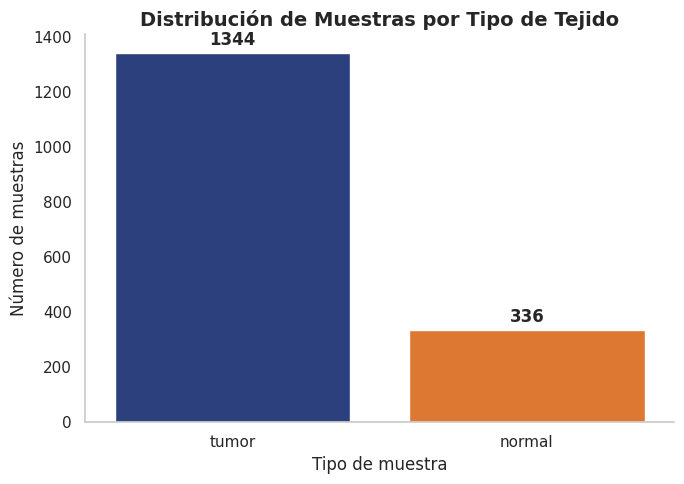


AUDITORÍA DE DISTRIBUCIÓN DE CLASES
Total de muestras : 1,680
Muestras tumorales: 1,344 (80.0%)
Muestras normales : 336 (20.0%)
Ratio Tumor/Normal: 4.00:1

Evaluación: Desbalance moderado


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import os

fig = plt.figure(figsize=(7,5))

ax = sns.countplot(
    data=meta,
    x="tipo",
    hue="tipo",
    palette={
        "tumor": "#1E3A8A",   # Azul oscuro
        "normal": "#F97316"   # Naranja
    },
    legend=False
)

plt.title(
    "Distribución de Muestras por Tipo de Tejido",
    fontsize=14,
    fontweight="bold"
)

plt.xlabel("Tipo de muestra")
plt.ylabel("Número de muestras")

plt.grid(False)
sns.despine()

# Etiquetas sobre las barras
for container in ax.containers:
    ax.bar_label(
        container,
        fmt="%d",
        padding=3,
        fontweight="bold"
    )

plt.tight_layout()
save_plot(fig, 'distribucion_muestras_por_tipo', format='jpg')
plt.show()

# ==========================
# AUDITORÍA DE RESULTADOS
# ==========================

conteo = meta["tipo"].value_counts()

total = len(meta)
tumor = conteo.get("tumor", 0)
normal = conteo.get("normal", 0)

pct_tumor = tumor / total * 100
pct_normal = normal / total * 100

ratio = tumor / normal

print("\n" + "="*60)
print("AUDITORÍA DE DISTRIBUCIÓN DE CLASES")
print("="*60)

print(f"Total de muestras : {total:,}")
print(f"Muestras tumorales: {tumor:,} ({pct_tumor:.1f}%)")
print(f"Muestras normales : {normal:,} ({pct_normal:.1f}%)")
print(f"Ratio Tumor/Normal: {ratio:.2f}:1")

# Evaluación automática
if ratio < 1.5:
    estado = "Balanceado"
elif ratio < 5:
    estado = "Desbalance moderado"
else:
    estado = "Desbalance severo"

print(f"\nEvaluación: {estado}")

print("="*60)

**Interpretación de resultados**

La distribución observada refleja un predominio de muestras tumorales, situación
habitual en estudios de expresión génica enfocados en investigación oncológica. El 80% de las muestras corresponden a tejido tumoral y el 20% a tejido normal.


La auditoría identifica un ratio Tumor/Normal de 4:1, lo que indica un desbalance moderado entre clases. Aunque ambas categorías disponen de un número
suficiente de observaciones para realizar análisis estadísticos y entrenar
modelos predictivos, será recomendable utilizar validación estratificada y evaluar métricas como Precision, Recall y F1-Score durante la fase de Machine Learning.

### 4.2 Distribución de muestras por cohorte

Se analiza la distribución de las muestras según la cohorte tumoral a la que pertenecen (BRCA, KIRC, LUAD, PRAD, COAD). Se visualiza esta distribución mediante un gráfico de barras para identificar el tamaño relativo de cada cohorte y evaluar posibles desbalances, lo cual es relevante para la clasificación multiclase.

[OK] Gráfico 'distribucion_muestras_por_cohorte.jpg' guardado en: 'assets/distribucion_muestras_por_cohorte.jpg'


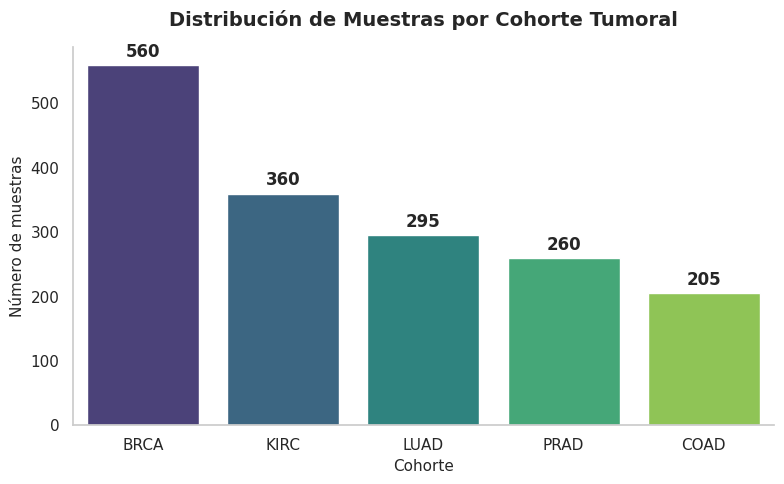


AUDITORÍA DE DISTRIBUCIÓN POR COHORTE
BRCA  :  560 muestras ( 33.3%)
KIRC  :  360 muestras ( 21.4%)
LUAD  :  295 muestras ( 17.6%)
PRAD  :  260 muestras ( 15.5%)
COAD  :  205 muestras ( 12.2%)
Evaluación               : Distribución moderadamente desigual


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import os

fig = plt.figure(figsize=(8,5))

orden = meta["cohorte"].value_counts().index

ax = sns.countplot(
    data=meta,
    x="cohorte",
    order=orden,
    palette="viridis"
)

plt.title(
    "Distribución de Muestras por Cohorte Tumoral",
    fontsize=14,
    fontweight="bold",
    pad=15
)

plt.xlabel("Cohorte", fontsize=11)
plt.ylabel("Número de muestras", fontsize=11)

plt.grid(False)
sns.despine()

# Etiquetas sobre las barras
for container in ax.containers:
    ax.bar_label(
        container,
        fmt="%d",
        padding=3,
        fontweight="bold"
    )

plt.tight_layout()
save_plot(fig, 'distribucion_muestras_por_cohorte', format='jpg')
plt.show()

# ======================================
# AUDITORÍA DE DISTRIBUCIÓN POR COHORTE
# ======================================

cohortes = meta["cohorte"].value_counts()
total = len(meta)

print("\n" + "="*60)
print("AUDITORÍA DE DISTRIBUCIÓN POR COHORTE")
print("="*60)

for cohorte, n_muestras in cohortes.items():
    porcentaje = (n_muestras / total) * 100
    print(
        f"{cohorte:<6}: "
        f"{n_muestras:>4} muestras "
        f"({porcentaje:>5.1f}%)"
    )

# Evaluación automática

ratio = cohortes.max() / cohortes.min()

if ratio < 2:
    estado = "Distribución equilibrada"
elif ratio < 3:
    estado = "Distribución moderadamente desigual"
else:
    estado = "Distribución desigual"

print(f"Evaluación               : {estado}")

print("="*60)

**Interpretación de resultados**

La cohorte BRCA representa el 33,3% del conjunto de datos, siendo la más numerosa, mientras que COAD aporta el 12,2% de las muestras. El ratio entre la cohorte más representada y la menos representada es de 2,73:1, indicando una distribución moderadamente desigual.

Aunque existen diferencias en el tamaño de las cohortes, todas cuentan con un número suficiente de muestras para realizar análisis exploratorios, estudios de expresión génica y tareas de clasificación.

### 4.3 Distribución global de la expresión génica

Esta subsección analiza la distribución general de los niveles de expresión génica en todo el dataset. Se utiliza un histograma para visualizar la frecuencia de los diferentes valores de expresión, junto con las medidas de tendencia central (media y mediana). Este análisis permite identificar patrones globales, como la presencia de genes altamente expresados o inactivos, y evaluar la consistencia de los datos tras la normalización.

[OK] Gráfico 'distribucion_global_expresion_genica.jpg' guardado en: 'assets/distribucion_global_expresion_genica.jpg'


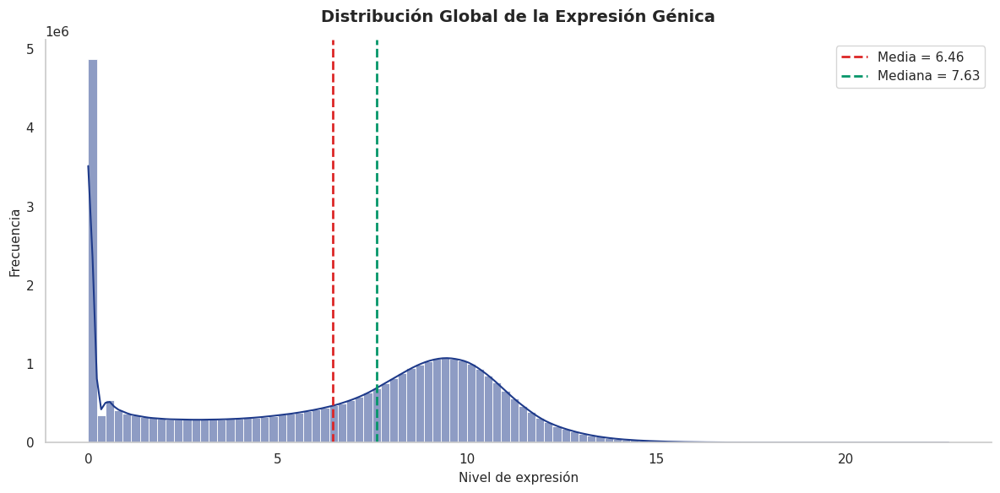


AUDITORÍA DE EXPRESIÓN GÉNICA GLOBAL
Observaciones totales : 34,492,080
Valor mínimo          : 0.000
Valor máximo          : 22.721
Media                 : 6.460
Mediana               : 7.627
Desviación estándar   : 4.050
Valores nulos (0)     : 14.14%

Evaluación: Baja dispersión de ceros


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os

fig = plt.figure(figsize=(12,6))

valores = X.values.ravel()

ax = sns.histplot(
    valores,
    bins=100,
    kde=True,
    color="#1E3A8A",
    edgecolor=None
)

# Estadísticas
media = valores.mean()
mediana = np.median(valores)

# Líneas de referencia
plt.axvline(
    media,
    color="#DC2626",
    linestyle="--",
    linewidth=2,
    label=f"Media = {media:.2f}"
)

plt.axvline(
    mediana,
    color="#059669",
    linestyle="--",
    linewidth=2,
    label=f"Mediana = {mediana:.2f}"
)

plt.title(
    "Distribución Global de la Expresión Génica",
    fontsize=14,
    fontweight="bold",
    pad=15
)

plt.xlabel("Nivel de expresión", fontsize=11)
plt.ylabel("Frecuencia", fontsize=11)

plt.legend()

plt.grid(False)
sns.despine()

plt.tight_layout()
save_plot(fig, 'distribucion_global_expresion_genica', format='jpg')
plt.show()

# ==========================================e
# AUDITORÍA DE EXPRESIÓN GÉNICA GLOBAL
# ==========================================

print("\n" + "="*60)
print("AUDITORÍA DE EXPRESIÓN GÉNICA GLOBAL")
print("="*60)

print(f"Observaciones totales : {len(valores):,}")
print(f"Valor mínimo          : {valores.min():.3f}")
print(f"Valor máximo          : {valores.max():.3f}")
print(f"Media                 : {valores.mean():.3f}")
print(f"Mediana               : {np.median(valores):.3f}")
print(f"Desviación estándar   : {valores.std():.3f}")

pct_ceros = (valores == 0).mean() * 100

print(f"Valores nulos (0)     : {pct_ceros:.2f}%")

# Evaluación automática

if pct_ceros < 20:
    calidad = "Baja dispersión de ceros"
elif pct_ceros < 50:
    calidad = "Dispersión moderada de ceros"
else:
    calidad = "Alta dispersión de ceros"

print(f"\nEvaluación: {calidad}")

print("="*60)

**Interpretación de resultados**

La distribución de los niveles de expresión génica muestra una concentración importante de observaciones en rangos medios y altos de expresión, acompañada de una cola hacia valores bajos que refleja la presencia de genes poco expresados o inactivos en determinadas muestras.

La forma de la distribución no evidencia acumulaciones anómalas ni patrones que sugieran errores de procesamiento o normalización. Asimismo, la amplitud observada confirma la existencia de una elevada heterogeneidad biológica entre genes y muestras.

El porcentaje de valores nulos es del 14,14%, lo que representa una baja dispersión de ceros y sugiere una buena cobertura de expresión génica en el conjunto de datos.

### 4.4 Distribución de la varianza génica

La varianza constituye una medida de dispersión que permite identificar qué genes presentan cambios significativos de expresión entre individuos. Los genes con mayor variabilidad suelen contener información biológica relevante y pueden resultar especialmente útiles en etapas posteriores de reducción de dimensionalidad, selección de características y modelado predictivo.

Este análisis permite evaluar cómo se distribuye la variabilidad génica en el conjunto de datos y detectar la presencia de genes altamente variables.

**Cálculo de varianza de cada gen**

Se calcula la varianza de expresión de cada uno de los 20.531 genes presentes en el conjunto de datos. Esta métrica permite cuantificar cuánto varía la expresión de cada gen entre las diferentes muestras analizadas.

In [ ]:
var_genes = X.var(axis=0)

print(f"Genes analizados: {len(var_genes):,}")

Genes analizados: 20,531


**Distribución de la varianza**

[OK] Gráfico 'distribucion_varianza_genica.jpg' guardado en: 'assets/distribucion_varianza_genica.jpg'


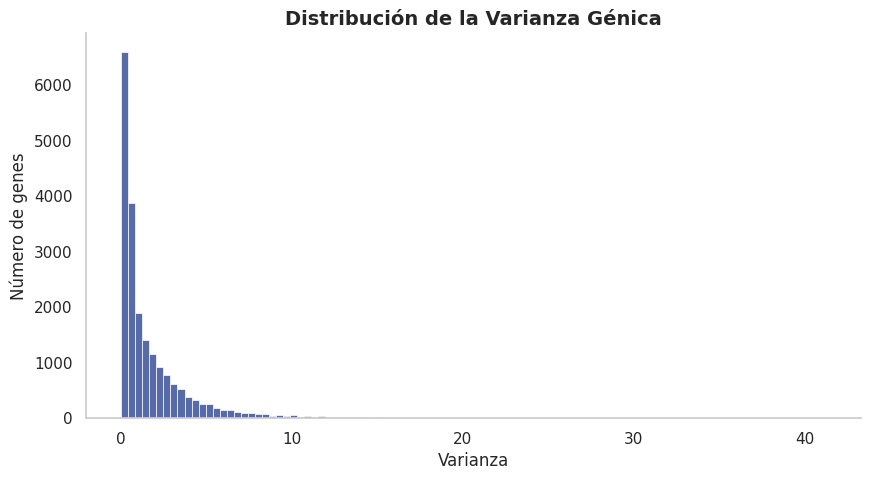


AUDITORÍA DE VARIANZA GÉNICA

Percentiles de varianza
P25 : 0.3270
P50 : 0.7907
P75 : 2.2566
P90 : 4.5143
P95 : 6.6861
P99 : 13.3171

Genes con varianza 0      : 256
Porcentaje               : 1.25%

Evaluación:
- Existen genes sin variabilidad que podrían eliminarse en fases posteriores.
- Existe un subconjunto reducido de genes altamente variables.


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os

fig = plt.figure(figsize=(10,5))

sns.histplot(
    var_genes,
    bins=100,
    color="#1E3A8A"
)

plt.title(
    "Distribución de la Varianza Génica",
    fontsize=14,
    fontweight="bold"
)

plt.xlabel("Varianza")
plt.ylabel("Número de genes")

plt.grid(False)
sns.despine()

save_plot(fig, 'distribucion_varianza_genica', format='jpg')
plt.show()

print("\n" + "="*60)
print("AUDITORÍA DE VARIANZA GÉNICA")
print("="*60)

print("\nPercentiles de varianza")

for p in [25, 50, 75, 90, 95, 99]:
    print(f"P{p:<2} : {np.percentile(var_genes, p):.4f}")

genes_sin_var = (var_genes == 0).sum()

print(f"\nGenes con varianza 0      : {genes_sin_var}")
print(f"Porcentaje               : {(genes_sin_var / len(var_genes)) * 100:.2f}%")

print("\nEvaluación:")

if genes_sin_var == 0:
    print("- No se detectan genes completamente constantes.")
else:
    print("- Existen genes sin variabilidad que podrían eliminarse en fases posteriores.")

if np.percentile(var_genes, 99) > np.percentile(var_genes, 50) * 5:
    print("- Existe un subconjunto reducido de genes altamente variables.")
else:
    print("- La variabilidad génica se distribuye de forma relativamente homogénea.")

print("="*60)

La distribución de la varianza génica muestra que la mayoría de los genes presentan niveles de variabilidad bajos o moderados, mientras que un subconjunto reducido concentra valores de varianza significativamente superiores.

Por este motivo, la altura de la primera barra es mucho mayor que el número de genes con varianza cero. El gráfico no muestra valores individuales, sino intervalos de varianza, por lo que varios miles de genes quedan concentrados en los primeros rangos de la distribución.

Esto indica que una gran proporción de los genes presenta una variabilidad muy baja entre muestras, mientras que solo una fracción reducida alcanza niveles elevados de variación.

**Identificación de genes extremadamente variables**

Cuantificar el número de genes pertenecientes al 1% superior de la distribución de varianza, ya que estos genes suelen concentrar una parte importante de la señal biológica presente en los datos.

In [ ]:
umbral = np.percentile(var_genes, 99)

genes_top1 = (var_genes >= umbral).sum()

print(f"Top 1% genes extremadamente variables: {genes_top1}")

Top 1% genes extremadamente variables: 206


La distribución observada indica que la información biológica no se encuentra repartida de forma uniforme entre los 20.531 genes analizados. Mientras que la mayoría presenta una expresión relativamente estable, un grupo reducido concentra gran parte de la variabilidad del dataset.

Identificar este subconjunto resulta de interés porque los genes altamente variables son los que tienen mayor capacidad potencial para diferenciar muestras y capturar patrones biológicos relevantes. Por ello, el análisis de los genes situados en los percentiles superiores de varianza constituye un paso previo útil para futuras tareas de exploración, reducción de dimensionalidad y aprendizaje automático.

## 4.5 PCA Exploratorio

El Análisis de Componentes Principales (PCA) se emplea para explorar la estructura global de los datos y visualizar las relaciones entre las muestras en un espacio de menor dimensión.


#### 4.5.1 PCA Tumor vs Normal


En esta sección, las muestras se representan según las dos primeras componentes principales y se colorean según su condición (tumoral o normal). El objetivo es evaluar si existen patrones de agrupamiento naturales que permitan distinguir ambos grupos antes de aplicar técnicas de selección de variables o modelos de clasificación.

In [ ]:
pca = PCA(n_components=2, random_state=42)

X_pca = pca.fit_transform(X)

pca_df = pd.DataFrame(
    X_pca,
    columns=["PC1", "PC2"]
)

pca_df["tipo"] = meta["tipo"].values

[OK] Gráfico 'pca_tumor_vs_normal.jpg' guardado en: 'assets/pca_tumor_vs_normal.jpg'


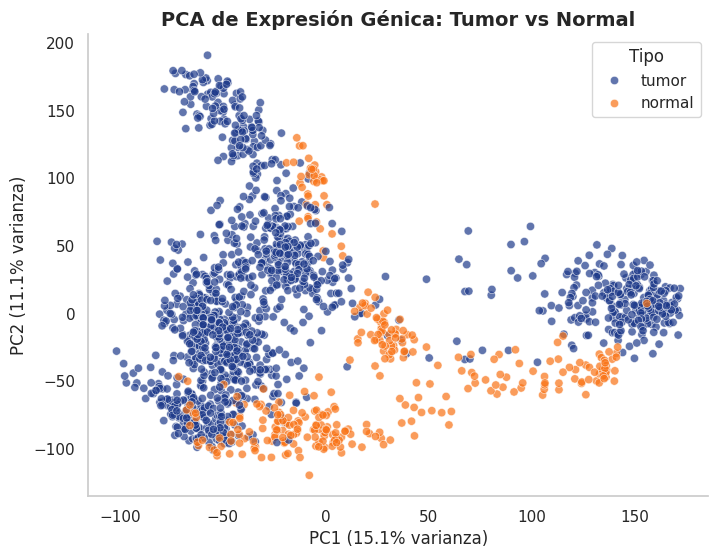

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import os

fig, ax = plt.subplots(figsize=(8, 6))

sns.scatterplot(
    data=pca_df,
    x="PC1",
    y="PC2",
    hue="tipo",
    palette={
        "tumor": "#1E3A8A",
        "normal": "#F97316"
    },
    alpha=0.7,
    ax=ax
)

plt.title(
    "PCA de Expresión Génica: Tumor vs Normal",
    fontsize=14,
    fontweight="bold"
)

plt.xlabel(
    f"PC1 ({pca.explained_variance_ratio_[0]*100:.1f}% varianza)"
)

plt.ylabel(
    f"PC2 ({pca.explained_variance_ratio_[1]*100:.1f}% varianza)"
)

plt.legend(title="Tipo")
plt.grid(False)
sns.despine()

save_plot(fig, 'pca_tumor_vs_normal', format='jpg')
plt.show()

In [ ]:
print("\n" + "="*60)
print("AUDITORÍA PCA TUMOR VS NORMAL")
print("="*60)

print(
    f"Varianza explicada PC1 : "
    f"{pca.explained_variance_ratio_[0]*100:.2f}%"
)

print(
    f"Varianza explicada PC2 : "
    f"{pca.explained_variance_ratio_[1]*100:.2f}%"
)

print(
    f"Varianza acumulada     : "
    f"{pca.explained_variance_ratio_.sum()*100:.2f}%"
)

print("="*60)


AUDITORÍA PCA TUMOR VS NORMAL
Varianza explicada PC1 : 15.10%
Varianza explicada PC2 : 11.13%
Varianza acumulada     : 26.23%


Las dos primeras componentes principales explican conjuntamente el 26,23% de la variabilidad total del conjunto de datos, una proporción considerable teniendo en cuenta la elevada dimensionalidad característica de los datos transcriptómicos.

La representación PCA revela una separación parcial entre las muestras tumorales y normales. Aunque existe cierto grado de solapamiento, ambos grupos tienden a ocupar regiones diferenciadas del espacio definido por las dos primeras componentes principales.

Este comportamiento sugiere que el estado tumoral constituye una fuente importante de variación en la expresión génica y que el conjunto de datos contiene una señal biológica relevante capaz de discriminar entre ambos tipos de muestras. La presencia de esta estructura respalda la viabilidad de aplicar posteriormente técnicas de clasificación para la identificación automática de muestras tumorales.

#### 4.5.2 PCA por cohorte

Se utiliza el Análisis de Componentes Principales (PCA) para explorar la distribución de las muestras según la cohorte tumoral de origen.

El objetivo es evaluar si los distintos tipos de cáncer presentan patrones de expresión génica diferenciados y forman agrupamientos naturales en el espacio definido por las dos primeras componentes principales.

In [ ]:
pca_df["cohorte"] = meta["cohorte"].values

[OK] Gráfico 'pca_expresion_genica_por_cohorte.jpg' guardado en: 'assets/pca_expresion_genica_por_cohorte.jpg'


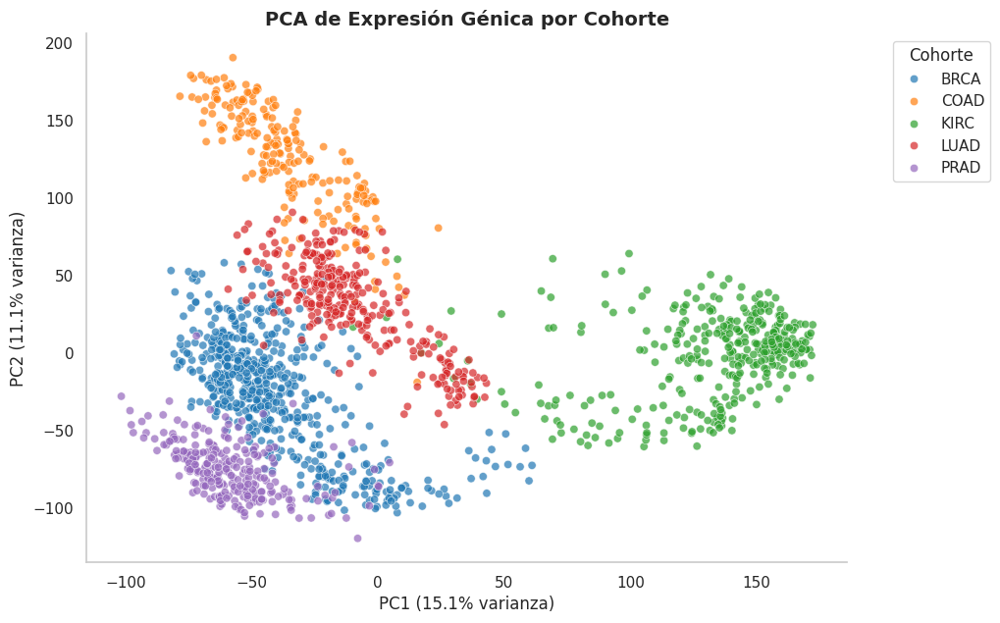

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import os

fig = plt.figure(figsize=(10, 7))

sns.scatterplot(
    data=pca_df,
    x="PC1",
    y="PC2",
    hue="cohorte",
    palette="tab10",
    alpha=0.7
)

plt.title(
    "PCA de Expresión Génica por Cohorte",
    fontsize=14,
    fontweight="bold"
)

plt.xlabel(
    f"PC1 ({pca.explained_variance_ratio_[0]*100:.1f}% varianza)"
)

plt.ylabel(
    f"PC2 ({pca.explained_variance_ratio_[1]*100:.1f}% varianza)"
)

plt.legend(
    title="Cohorte",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

plt.grid(False)
sns.despine()

save_plot(fig, 'pca_expresion_genica_por_cohorte', format='jpg')
plt.show()

In [ ]:
print("\n" + "="*60)
print("AUDITORÍA PCA POR COHORTE")
print("="*60)

print(
    f"Varianza explicada PC1 : "
    f"{pca.explained_variance_ratio_[0]*100:.2f}%"
)

print(
    f"Varianza explicada PC2 : "
    f"{pca.explained_variance_ratio_[1]*100:.2f}%"
)

print(
    f"Varianza acumulada     : "
    f"{pca.explained_variance_ratio_.sum()*100:.2f}%"
)

print("\nDistribución de muestras:")

for cohorte, n in meta["cohorte"].value_counts().items():
    print(f"{cohorte:<5}: {n}")

print("="*60)


AUDITORÍA PCA POR COHORTE
Varianza explicada PC1 : 15.10%
Varianza explicada PC2 : 11.13%
Varianza acumulada     : 26.23%

Distribución de muestras:
BRCA : 560
KIRC : 360
LUAD : 295
PRAD : 260
COAD : 205


El PCA por cohorte muestra que las muestras no se distribuyen de forma aleatoria, sino que tienden a agruparse según el tipo de cáncer al que pertenecen. Esta organización indica que las diferencias biológicas entre cohortes constituyen una fuente importante de variación en la expresión génica.

Algunas cohortes presentan agrupamientos claramente definidos, como KIRC, que aparece separada del resto en la zona derecha del gráfico, o PRAD y COAD, que ocupan regiones específicas del espacio PCA. Por otro lado, cohortes como BRCA y LUAD muestran un mayor grado de dispersión y solapamiento, reflejando una mayor heterogeneidad interna o similitudes transcriptómicas con otros tipos tumorales.

Las dos primeras componentes principales explican conjuntamente el 26,23% de la variabilidad total del conjunto de datos, porcentaje considerable teniendo en cuenta las más de 20.000 variables analizadas. La capacidad de estas dos componentes para generar agrupamientos diferenciados sugiere que la expresión génica contiene una señal biológica suficientemente fuerte como para distinguir distintos tipos de cáncer.

En conjunto, estos resultados indican que el dataset presenta una estructura biológica coherente y que la información transcriptómica podría utilizarse tanto para diferenciar tejido tumoral de tejido normal como para discriminar entre distintas cohortes tumorales en fases posteriores del análisis.

### 4.6 Top 50 genes más Variables

Tras identificar una estructura biológica clara mediante PCA, se analizan los genes con mayor variabilidad entre muestras. Los genes altamente variables suelen concentrar gran parte de la información diferencial del transcriptoma y permiten visualizar patrones de agrupamiento asociados a distintos estados biológicos.

In [ ]:
top50_genes = (
    var_genes
    .sort_values(ascending=False)
    .head(50)
)

[OK] Gráfico 'heatmap_top_genes_cohorte.jpg' guardado en: 'assets/heatmap_top_genes_cohorte.jpg'


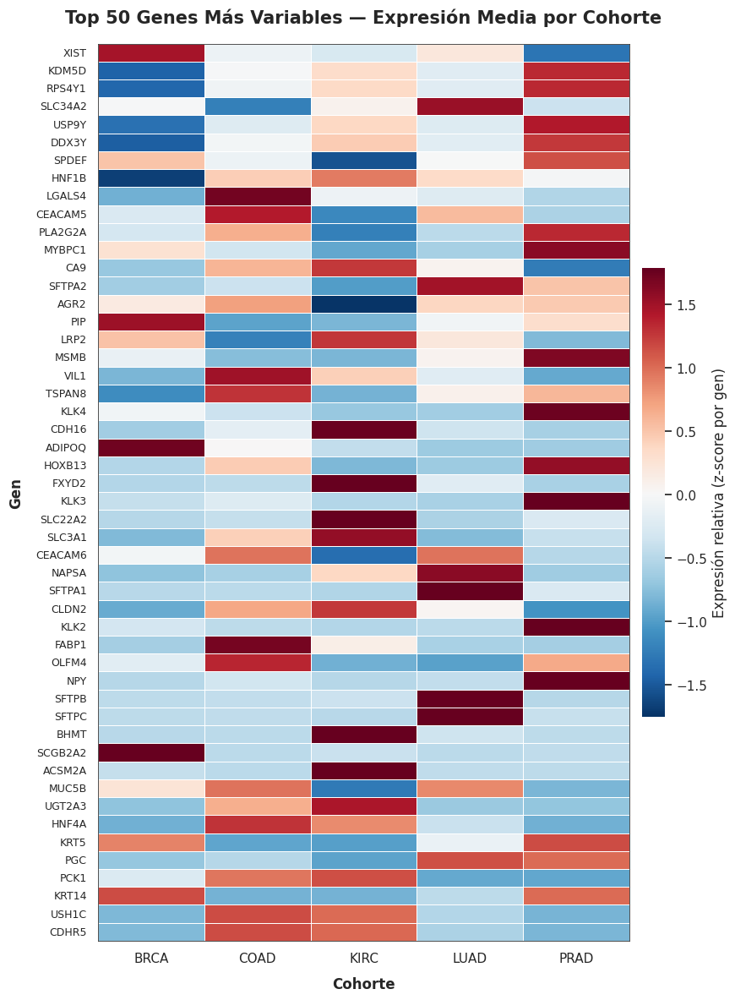

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import os
import pandas as pd

# ============================================================
# HEATMAP — Top genes más variables por cohorte
# ============================================================

top_n_heatmap = 50
# Re-calculating top50_genes and var_genes, assuming X is available from previous cells.
# This is a temporary fix; ideally previous cells setting these variables should run first.
if 'X' in locals() and 'pd' in locals():
    var_genes = X.var(axis=0)
    top50_genes = (
        var_genes
        .sort_values(ascending=False)
        .head(50)
    )
else:
    print("[ERROR] 'X' or 'pd' not defined. Please ensure previous cells are run.")
    top50_genes = pd.Series([]) # Create an empty series to prevent further errors

if not top50_genes.empty:
    genes_heatmap = top50_genes.head(top_n_heatmap).index.tolist()

    # Expresión media por cohorte (incluye 'normal' si queréis comparar contra tejido sano)
    if 'df' in locals() and 'genes_heatmap' in locals():
        expr_por_cohorte = df.groupby("cohorte")[genes_heatmap].mean().T

        # Estandarizamos por gen (fila) solo para el COLOR del heatmap —
        # esto es escalado visual, no toca los datos originales (ver nota de más abajo)
        expr_scaled = expr_por_cohorte.sub(expr_por_cohorte.mean(axis=1), axis=0) \
                                       .div(expr_por_cohorte.std(axis=1), axis=0)

        # Orden por gen más "informativo" (mayor rango entre cohortes)
        orden = expr_scaled.max(axis=1) - expr_scaled.min(axis=1)
        expr_scaled = expr_scaled.loc[orden.sort_values(ascending=False).index]

        fig, ax = plt.subplots(figsize=(9, 12))

        hm = sns.heatmap(
            expr_scaled,
            cmap="RdBu_r",              # rojo = sobreexpresado, azul = infraexpresado
            center=0,
            linewidths=0.4,
            linecolor="white",
            cbar_kws={
                "label": "Expresión relativa (z-score por gen)",
                "shrink": 0.5,
                "pad": 0.02
            },
            square=False,
            ax=ax
        )

        ax.set_title(
            f"Top {top_n_heatmap} Genes Más Variables — Expresión Media por Cohorte",
            fontsize=15, fontweight="bold", pad=18
        )
        ax.set_xlabel("Cohorte", fontsize=12, fontweight="bold", labelpad=10)
        ax.set_ylabel("Gen", fontsize=12, fontweight="bold", labelpad=10)

        ax.set_xticklabels(ax.get_xticklabels(), rotation=0, fontsize=11)
        ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=9)

        # Línea sutil separando ejes
        for spine in ax.spines.values():
            spine.set_visible(True)
            spine.set_color("#333333")
            spine.set_linewidth(0.6)

        plt.tight_layout()
        # Replaced plt.savefig with the new save_plot function
        save_plot(fig, "heatmap_top_genes_cohorte", format='jpg')
        plt.show()
    else:
        print("[ERROR] 'df' or 'genes_heatmap' not defined. Cannot generate heatmap.")


El heatmap muestra la expresión media por cohorte de los 50 genes con mayor variabilidad del conjunto de datos, tras normalizar cada gen mediante Z-score.

Se observan patrones de expresión diferenciados entre las cohortes tumorales, evidenciando que determinados genes presentan niveles de expresión característicos según el tipo de cáncer. Destaca especialmente la cohorte KIRC, que muestra perfiles claramente diferenciados en numerosos genes, en línea con la separación observada previamente en el análisis PCA.

Asimismo, algunas cohortes comparten patrones de expresión similares en determinados grupos génicos, mientras que otras presentan comportamientos opuestos (sobreexpresión frente a infraexpresión), lo que sugiere la existencia de firmas transcriptómicas específicas para cada tumor.

Estos resultados confirman que los genes más variables contienen información biológica relevante y respaldan la viabilidad de futuras tareas de clasificación y predicción basadas en expresión génica.

In [ ]:
print("\n" + "="*60)
print("TOP 50 GENES MÁS VARIABLES")
print("="*60)

print(f"Genes seleccionados : {len(top50_genes)}")

for gen, var in top50_genes.head(50).items():
    print(f"{gen:<20} {var:.4f}")

print("="*60)


TOP 50 GENES MÁS VARIABLES
Genes seleccionados : 50
KLK3                 41.2320
SFTPB                37.1776
KLK2                 33.6899
RPS4Y1               32.3067
CEACAM5              31.5884
XIST                 30.4097
SFTPA2               30.3223
SFTPA1               29.5342
CEACAM6              29.4462
SCGB2A2              28.1448
MSMB                 27.3034
SFTPC                25.9108
CDH16                24.4627
HOXB13               24.1444
DDX3Y                23.9273
CDHR5                23.6616
HNF4A                23.2232
SLC34A2              23.1925
AGR2                 23.1757
USH1C                22.9838
NAPSA                22.7492
UGT2A3               22.2572
KRT5                 22.2337
PGC                  22.1630
OLFM4                22.0805
FXYD2                22.0316
LRP2                 21.9566
KDM5D                21.8786
KRT14                21.5080
KLK4                 21.4467
CA9                  21.3280
SLC22A2              21.2070
ADIPOQ             

### 4.7 PCA solo de muestras Tumorales

Analizar la estructura interna de las muestras tumorales para evaluar si los distintos tipos de cáncer presentan patrones de expresión génica diferenciados una vez eliminadas las muestras normales.

In [ ]:
tumor_mask = meta["tipo"] == "tumor"

X_tumor = X.loc[tumor_mask]
meta_tumor = meta.loc[tumor_mask]

print(X_tumor.shape)
print(meta_tumor["cohorte"].value_counts())

(1344, 20531)
cohorte
BRCA    448
KIRC    288
LUAD    236
PRAD    208
COAD    164
Name: count, dtype: int64


In [ ]:
from sklearn.decomposition import PCA

pca = PCA(
    n_components=2,
    random_state=42
)

X_pca_tumor = pca.fit_transform(X_tumor)

In [ ]:
pca_tumor_df = pd.DataFrame(
    X_pca_tumor,
    columns=["PC1", "PC2"]
)

pca_tumor_df["cohorte"] = meta_tumor["cohorte"].values

[OK] Gráfico 'pca_muestras_tumorales.jpg' guardado en: 'assets/pca_muestras_tumorales.jpg'


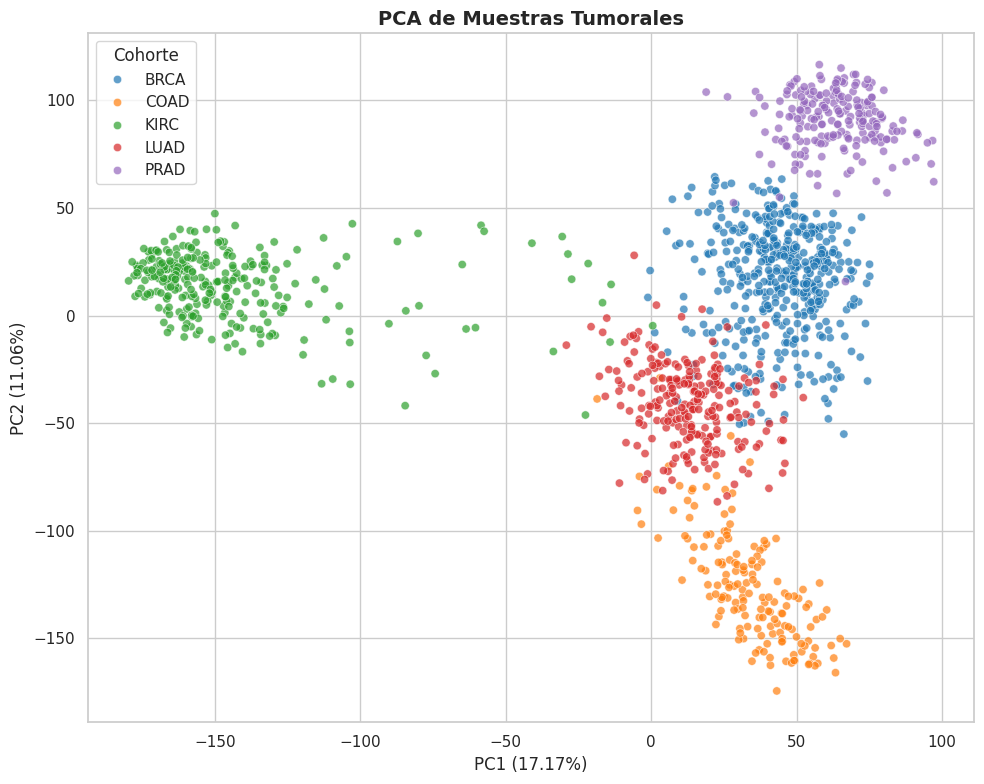

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import os

fig = plt.figure(figsize=(10,8))

sns.scatterplot(
    data=pca_tumor_df,
    x="PC1",
    y="PC2",
    hue="cohorte",
    palette="tab10",
    alpha=0.7
)

plt.title(
    "PCA de Muestras Tumorales",
    fontsize=14,
    fontweight="bold"
)

plt.xlabel(
    f"PC1 ({pca.explained_variance_ratio_[0]*100:.2f}%)"
)

plt.ylabel(
    f"PC2 ({pca.explained_variance_ratio_[1]*100:.2f}%)"
)

plt.legend(title="Cohorte")

plt.tight_layout()

save_plot(fig, 'pca_muestras_tumorales', format='jpg')
plt.show()

In [ ]:
print("\n" + "="*60)
print("PCA - MUESTRAS TUMORALES")
print("="*60)

print(f"PC1 : {pca.explained_variance_ratio_[0]*100:.2f}%")
print(f"PC2 : {pca.explained_variance_ratio_[1]*100:.2f}%")

print(
    f"\nVarianza acumulada : "
    f"{pca.explained_variance_ratio_[:2].sum()*100:.2f}%"
)

print("\nDistribución de muestras:")

for cohorte, n in meta_tumor["cohorte"].value_counts().items():
    print(f"{cohorte}: {n}")

print("="*60)


PCA - MUESTRAS TUMORALES
PC1 : 17.17%
PC2 : 11.06%

Varianza acumulada : 28.23%

Distribución de muestras:
BRCA: 448
KIRC: 288
LUAD: 236
PRAD: 208
COAD: 164


El PCA realizado exclusivamente sobre las muestras tumorales revela una clara estructura de agrupamiento asociada al tipo de cáncer. Las dos primeras componentes principales explican aproximadamente el 28.2% de la variabilidad total del conjunto de datos (PC1: 17.17%, PC2: 11.06%).

Se observa una separación evidente entre las cinco cohortes tumorales, indicando que cada tipo de cáncer presenta un perfil transcriptómico característico. KIRC aparece completamente aislado a lo largo de la primera componente principal, sugiriendo una firma génica altamente diferenciada respecto al resto de tumores. PRAD también forma un clúster compacto y bien definido, mientras que COAD y LUAD muestran una separación clara principalmente a lo largo de la segunda componente principal.

BRCA presenta una mayor dispersión interna y cierto solapamiento con otras cohortes, lo que sugiere una mayor heterogeneidad biológica dentro de este tipo tumoral.

En conjunto, los resultados muestran que la expresión génica contiene una fuerte señal discriminativa capaz de diferenciar los distintos tipos de cáncer, respaldando la aplicación posterior de técnicas de selección de variables y modelos de clasificación multiclase.

## 5. Generación del Reporte de Ranking de Genes

Como complemento al análisis exploratorio, se generó un ranking de los 50 genes con mayor variabilidad de expresión en el conjunto de datos.

Para cada gen se calcularon:

- Media de expresión (escala log2).
- Desviación estándar.
- Varianza.

La variabilidad génica constituye un criterio relevante para identificar genes potencialmente informativos en tareas posteriores de selección de características y clasificación.

Los resultados fueron exportados a un archivo Excel para facilitar su consulta y reutilización durante las siguientes fases del proyecto.

In [ ]:
#============================================================
#====Modificado segundo log===================================
#============================================================


def generar_ranking_genes_completo(X, n_top_genes=50):

    print(f"--- Generando Ranking de los {n_top_genes} Genes más Variables ---")

    # Los datos YA vienen en log2. NO se vuelve a transformar.
    medias = X.mean(axis=0)
    desviaciones = X.std(axis=0)
    varianzas = X.var(axis=0)

    df_estadisticas = pd.DataFrame({
        "Gen": X.columns,
        "Media_Log2": medias.values,
        "Desviacion_Estandar_Log2": desviaciones.values,
        "Varianza_Log2": varianzas.values
    })

    df_ranking_top = (
        df_estadisticas
        .sort_values(
            by="Varianza_Log2",
            ascending=False
        )
        .head(n_top_genes)
        .reset_index(drop=True)
        .round(4)
    )

    print(f"[OK] Ranking completado con {df_ranking_top.shape[0]} registros.")

    return df_ranking_top


output_folder = "reports"
os.makedirs(output_folder, exist_ok=True)

df_top_50_genes = generar_ranking_genes_completo(
    X,
    n_top_genes=50
)

archivo_excel = os.path.join(
    output_folder,
    "OncoSeq_Top50_Genes_Variables.xlsx"
)

df_top_50_genes.to_excel(
    archivo_excel,
    index=False,
    sheet_name="Ranking_Variabilidad"
)

print(f"[OK] Archivo generado: {archivo_excel}")

display(df_top_50_genes.head(10))

--- Generando Ranking de los 50 Genes más Variables ---
[OK] Ranking completado con 50 registros.
[OK] Archivo generado: reports/OncoSeq_Top50_Genes_Variables.xlsx


,Gen,Media_Log2,Desviacion_Estandar_Log2,Varianza_Log2
0,KLK3,3.9585,6.4212,41.231998
1,SFTPB,4.0338,6.0973,37.177601
2,KLK2,3.5111,5.8043,33.689899
3,RPS4Y1,5.6501,5.6839,32.306702
4,CEACAM5,6.7264,5.6204,31.588400
5,XIST,7.6354,5.5145,30.409700
6,SFTPA2,5.8617,5.5066,30.322300
7,SFTPA1,3.0263,5.4345,29.534201
8,CEACAM6,8.0924,5.4264,29.446199
9,SCGB2A2,3.4644,5.3052,28.144800


## Corrección del doble log2 en el ranking de genes

### Qué se detectó

La función `generar_ranking_genes_completo` aplicaba `np.log2(X + 1)` a los datos antes de
calcular las estadísticas de variabilidad. Sin embargo, **los datos del parquet ya vienen en
escala log2** (normalización RSEM + log2). Aplicar `log2` de nuevo es una **doble
transformación**: comprime los valores por segunda vez y distorsiona media, desviación y
varianza.

### Qué se cambió

1. **Carga:** se renombran las columnas de `gene_N` a nombres reales usando `gene_names.csv`
   (mapeo verificado en el notebook F2), con `assert` de seguridad. Las gráficas pasan a
   mostrar `KLK3` en lugar de `gene_9176`.
2. **Función de ranking:** se elimina la línea `X_log = np.log2(X + 1)` y se usa `X`
   directamente (ya está en log2).

### El impacto: no era cosmético, cambiaba la biología

Al comparar las dos versiones, el ranking de genes más variables **cambió por completo**:

- **Antes (doble log2):** dominado por genes del cromosoma Y y de inactivación del X
  (`RPS4Y1`, `DDX3Y`, `KDM5D`, `USP9Y`, `EIF1AY`, `UTY`) — es decir, **genes de sexo**. Seis
  de los ocho primeros. El marcador de próstata `KLK3` quedaba en el puesto 9.
- **Después (log2 correcto):** encabezado por **marcadores de tejido y tumor reales** —
  `KLK3`/`KLK2` (próstata, PSA), `SFTPB`/`SFTPA1`/`SFTPA2` (surfactante pulmonar),
  `CEACAM5`/`CEACAM6` (colon), `SCGB2A2` (mama).

Las varianzas pasaron de un rango comprimido (2,4–2,8) al real (28–41).

### Por qué ocurría

El `log2` comprime los valores altos; aplicado dos veces, aplasta las diferencias reales
entre genes. Solo "sobrevivían" como variables los de patrón binario extremo (presente/ausente
según el sexo), que no aportan señal sobre el cáncer. El bug **enterraba los marcadores
tumorales y sacaba a flote ruido demográfico**.

### Por qué importa

Es un fallo **silencioso**: no producía error ni warning. El notebook se ejecutaba limpio y
generaba un Excel de aspecto correcto, pero con conclusiones biológicamente equivocadas. Se
detectó **contrastando el resultado con la biología conocida**: al ver que el top eran genes
de sexo en lugar de marcadores de tejido, algo no encajaba.

[OK] Gráfico 'top_10_genes_doble_log2_efecto.jpg' guardado en: 'assets/top_10_genes_doble_log2_efecto.jpg'


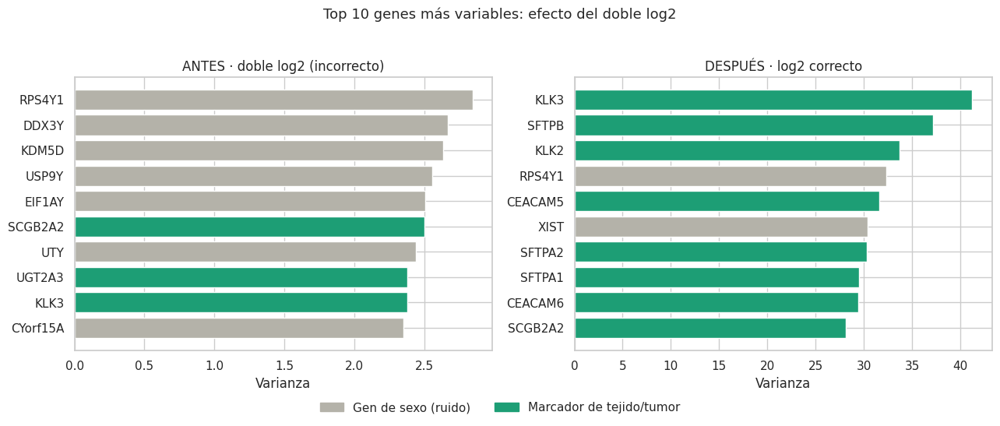

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch
import os

# --- Datos de la comparación (calculados sobre X ya renombrado con nombres reales) ---
# ANTES: con el doble log2 (reproducimos el bug solo para la comparación)
var_antes = np.log2(X + 1).var(axis=0).sort_values(ascending=False).head(10)
# DESPUÉS: correcto (X ya está en log2)
var_despues = X.var(axis=0).sort_values(ascending=False).head(10)

# Genes de sexo, para colorearlos distinto
genes_sexo = {'RPS4Y1','DDX3Y','KDM5D','USP9Y','EIF1AY','UTY','XIST','CYorf15A','TTTY15'}

def color_barras(genes):
    return ['#B4B2A9' if g in genes_sexo else '#1D9E75' for g in genes]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(13, 5))

# ANTES
ax1.barh(var_antes.index[::-1], var_antes.values[::-1],
         color=color_barras(var_antes.index[::-1]))
ax1.set_title('ANTES · doble log2 (incorrecto)', fontsize=12)
ax1.set_xlabel('Varianza')

# DESPUÉS
ax2.barh(var_despues.index[::-1], var_despues.values[::-1],
         color=color_barras(var_despues.index[::-1]))
ax2.set_title('DESPUÉS · log2 correcto', fontsize=12)
ax2.set_xlabel('Varianza')

# Leyenda común
leyenda = [Patch(color='#B4B2A9', label='Gen de sexo (ruido)'),
           Patch(color='#1D9E75', label='Marcador de tejido/tumor')]
fig.legend(handles=leyenda, loc='lower center', ncol=2, frameon=False, bbox_to_anchor=(0.5, -0.05))

fig.suptitle('Top 10 genes más variables: efecto del doble log2', fontsize=13, y=1.02)
plt.tight_layout()
save_plot(fig, 'top_10_genes_doble_log2_efecto', format='jpg')
plt.show()

## 6. Documentación Detallada: Generación de CSV y Guardado de Archivos

Esta sección final del notebook se encarga de consolidar los resultados obtenidos, guardando el dataset limpio y facilitando la descarga de todos los gráficos generados durante el análisis exploratorio.



### 6.1 Guardado del Dataset Limpio (`dataset_clean.csv`)

La primera parte de esta sección se dedica a guardar el DataFrame `df`, que contiene la matriz de expresión génica combinada con los metadatos ya alineados, en un archivo CSV llamado `dataset_clean.csv`.





In [ ]:
output_folder = 'data'
os.makedirs(output_folder, exist_ok=True)

file_name = 'dataset_clean.csv'
file_path = os.path.join(output_folder, file_name)

# Guardar el DataFrame 'df' limpio en un archivo CSV
df.to_csv(file_path, index=False)

print(f"El dataset limpio se ha guardado exitosamente en: '{file_path}'")

El dataset limpio se ha guardado exitosamente en: 'data/dataset_clean.csv'


### 6.2 Montaje de Google Drive y Búsqueda de Archivos





In [ ]:
# ¿Dónde está ejecutando Colab ahora mismo?
print("Directorio actual:", os.getcwd())

# ¿Dónde cayó el fichero?
print("Ruta del fichero:", os.path.abspath("data/dataset_clean.csv"))

# ¿Existe? ¿Cuántas filas?
df_check = pd.read_csv("data/dataset_clean.csv")
print("Filas:", len(df_check))

Directorio actual: /content
Ruta del fichero: /content/data/dataset_clean.csv
Filas: 1680


In [ ]:
drive.mount('/content/drive', force_remount=True)

encontrados = glob.glob('/content/drive/**/oncoseq_expresion.parquet', recursive=True)
print("Parquet encontrado en:", encontrados)

Mounted at /content/drive
Parquet encontrado en: []


### 6.3 Empaquetado y Descarga de Activos (`assets.zip`)

Finalmente, esta sección proporciona una forma conveniente de descargar todos los gráficos generados y guardados en la carpeta `assets`.


In [ ]:
import shutil
from google.colab import files

shutil.make_archive("assets", "zip", "assets")

files.download("assets.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>